In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

from matplotlib.colors import ListedColormap

import warnings
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import StandardScaler, normalize

from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression

from sklearn.preprocessing import OneHotEncoder
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier

from xgboost import XGBClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score

In [2]:
df = pd.read_csv('/content/unpopular_songs.csv')
df.head()

,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_ms,explicit,popularity,track_name,track_artist,track_id
0,0.530,0.770,4,-6.633,0,0.0389,0.284,0.501000,0.744,0.623,120.144,225696,False,2,No Regrets,James Reeder,6f2c4a9lNx8aowZJngv7cJ
1,0.565,0.730,1,-6.063,1,0.0730,0.365,0.000000,0.237,0.511,130.026,158093,False,2,Wild Life,James Reeder,3fTs52jsDzSuVLsifxNKO8
2,0.427,0.546,4,-8.727,1,0.0849,0.539,0.015200,0.368,0.435,78.345,167262,False,2,Fangs,James Reeder,6NPafqavrv0icaIHMQnXDy
3,0.421,0.531,7,-5.516,1,0.0262,0.706,0.000208,0.110,0.383,85.080,236832,False,2,Afterburner,James Reeder,3vGmhxveURgmlZStvo0uc1
4,0.537,0.804,8,-7.378,0,0.1570,0.379,0.000489,0.323,0.543,139.950,239400,False,2,Hellfire Rising,James Reeder,4O2qRbfCHzMMgfbw9DBdGf


In [3]:
df.tail()

,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_ms,explicit,popularity,track_name,track_artist,track_id
10872,0.686,0.1320,0,-20.363,1,0.0339,0.268,0.00105,0.181,0.4910,95.987,285286,False,7,Bugs n Toes,"Good Girl, Bad Boy",2ykd7eWIVcI3ck7x4OR9T1
10873,0.532,0.0573,11,-20.476,0,0.0479,0.900,0.08770,0.111,0.0731,114.123,360729,False,7,Scattered Thoughts,"Good Girl, Bad Boy",4ceFgUuLwydkHyMK9qnMW8
10874,0.589,0.0308,3,-27.237,1,0.0405,0.943,0.01420,0.106,0.5040,83.952,286585,False,7,Travelin Bug,"Good Girl, Bad Boy",5HASiM0dbIU1saPBEAlVfw
10875,0.669,0.0381,7,-18.631,1,0.0382,0.783,0.00000,0.182,0.1730,99.841,349454,False,7,Goodnight,"Good Girl, Bad Boy",7eqGtA8qyFgozTSBqGrEws
10876,0.818,0.1460,9,-19.684,0,0.1230,0.828,0.95900,0.108,0.2350,110.026,74180,False,14,Paranoid,Talen Talea,5cP6IfMkPIxMDEzemOJ6OF


In [4]:
df.shape

(10877, 17)

In [5]:
df.columns

Index(['danceability', 'energy', 'key', 'loudness', 'mode', 'speechiness',
       'acousticness', 'instrumentalness', 'liveness', 'valence', 'tempo',
       'duration_ms', 'explicit', 'popularity', 'track_name', 'track_artist',
       'track_id'],
      dtype='object')

In [6]:
df['explicit'].value_counts()

explicit
False    7945
True     2932
Name: count, dtype: int64

In [7]:
df['track_artist'].value_counts()

track_artist
Alei Islah                               75
Ocean Sounds                             70
Blackjesus Yoshua                        58
Native American Flute                    50
Sounds Of Nature : Thunderstorm, Rain    50
                                         ..
Grupo Vision                              1
Dj Pinpon                                 1
Mariachi los Vargas de Arturo Mendoza     1
Elias Torres y su guitarra                1
Talen Talea                               1
Name: count, Length: 2057, dtype: int64

In [8]:
df.isnull().sum()

danceability        0
energy              0
key                 0
loudness            0
mode                0
speechiness         0
acousticness        0
instrumentalness    0
liveness            0
valence             0
tempo               0
duration_ms         0
explicit            0
popularity          0
track_name          0
track_artist        0
track_id            0
dtype: int64

In [9]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10877 entries, 0 to 10876
Data columns (total 17 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   danceability      10877 non-null  float64
 1   energy            10877 non-null  float64
 2   key               10877 non-null  int64  
 3   loudness          10877 non-null  float64
 4   mode              10877 non-null  int64  
 5   speechiness       10877 non-null  float64
 6   acousticness      10877 non-null  float64
 7   instrumentalness  10877 non-null  float64
 8   liveness          10877 non-null  float64
 9   valence           10877 non-null  float64
 10  tempo             10877 non-null  float64
 11  duration_ms       10877 non-null  int64  
 12  explicit          10877 non-null  bool   
 13  popularity        10877 non-null  int64  
 14  track_name        10877 non-null  object 
 15  track_artist      10877 non-null  object 
 16  track_id          10877 non-null  object

In [10]:
df.iloc[:, 14:17]

,track_name,track_artist,track_id
0,No Regrets,James Reeder,6f2c4a9lNx8aowZJngv7cJ
1,Wild Life,James Reeder,3fTs52jsDzSuVLsifxNKO8
2,Fangs,James Reeder,6NPafqavrv0icaIHMQnXDy
3,Afterburner,James Reeder,3vGmhxveURgmlZStvo0uc1
4,Hellfire Rising,James Reeder,4O2qRbfCHzMMgfbw9DBdGf
...,...,...,...
10872,Bugs n Toes,"Good Girl, Bad Boy",2ykd7eWIVcI3ck7x4OR9T1
10873,Scattered Thoughts,"Good Girl, Bad Boy",4ceFgUuLwydkHyMK9qnMW8
10874,Travelin Bug,"Good Girl, Bad Boy",5HASiM0dbIU1saPBEAlVfw
10875,Goodnight,"Good Girl, Bad Boy",7eqGtA8qyFgozTSBqGrEws


In [11]:
df.drop(df.iloc[:, 14:17], inplace=True, axis=1)
df.head()

,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_ms,explicit,popularity
0,0.530,0.770,4,-6.633,0,0.0389,0.284,0.501000,0.744,0.623,120.144,225696,False,2
1,0.565,0.730,1,-6.063,1,0.0730,0.365,0.000000,0.237,0.511,130.026,158093,False,2
2,0.427,0.546,4,-8.727,1,0.0849,0.539,0.015200,0.368,0.435,78.345,167262,False,2
3,0.421,0.531,7,-5.516,1,0.0262,0.706,0.000208,0.110,0.383,85.080,236832,False,2
4,0.537,0.804,8,-7.378,0,0.1570,0.379,0.000489,0.323,0.543,139.950,239400,False,2


In [12]:
from sklearn import preprocessing

label_encoder = preprocessing.LabelEncoder()

df['explicit']= label_encoder.fit_transform(df['explicit'])

df['explicit'].unique()

array([0, 1])

In [13]:
df.head()

,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_ms,explicit,popularity
0,0.530,0.770,4,-6.633,0,0.0389,0.284,0.501000,0.744,0.623,120.144,225696,0,2
1,0.565,0.730,1,-6.063,1,0.0730,0.365,0.000000,0.237,0.511,130.026,158093,0,2
2,0.427,0.546,4,-8.727,1,0.0849,0.539,0.015200,0.368,0.435,78.345,167262,0,2
3,0.421,0.531,7,-5.516,1,0.0262,0.706,0.000208,0.110,0.383,85.080,236832,0,2
4,0.537,0.804,8,-7.378,0,0.1570,0.379,0.000489,0.323,0.543,139.950,239400,0,2


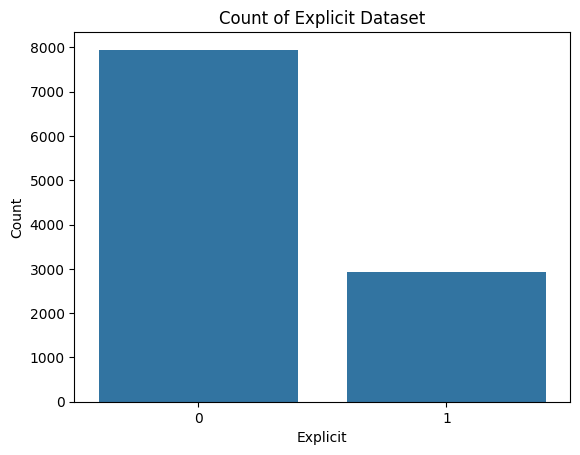

In [18]:
sns.countplot(data=df, x='explicit')
plt.xlabel('Explicit')
plt.ylabel('Count')
plt.title('Count of Explicit Dataset')

plt.show()

<Axes: >

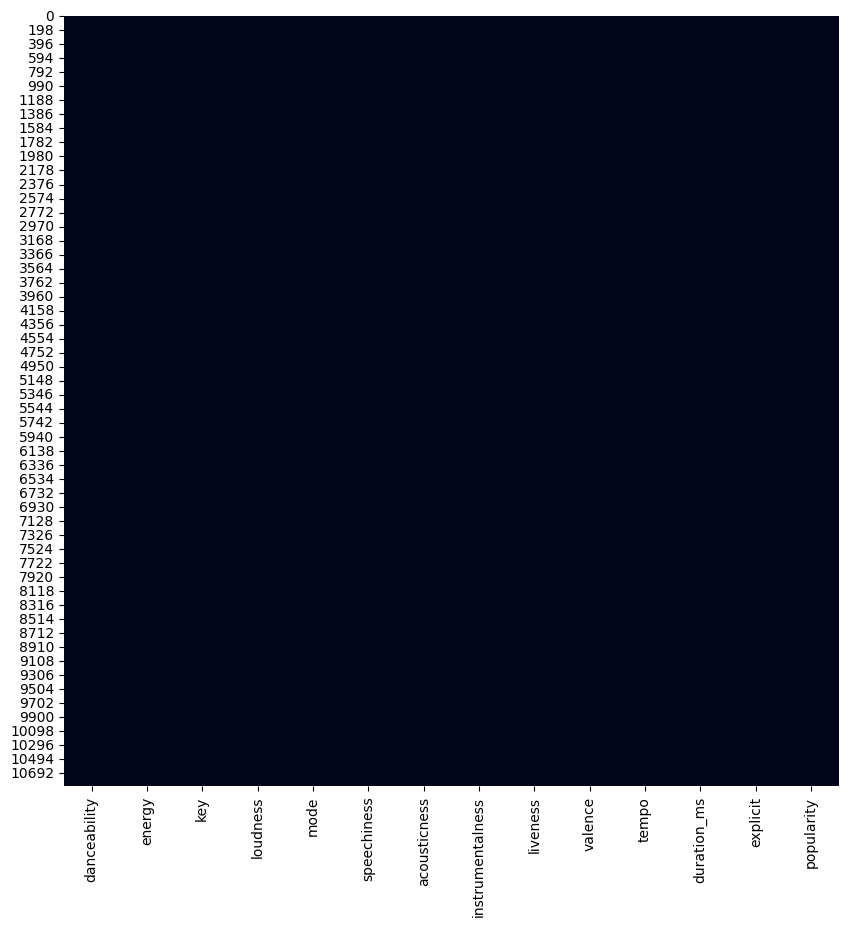

In [19]:
plt.figure(figsize = (10,10))
sns.heatmap(df.isnull(), cbar=False)

In [20]:
df.describe()

,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_ms,explicit,popularity
count,10877.000000,10877.000000,10877.000000,10877.000000,10877.000000,10877.000000,10877.000000,10877.000000,10877.000000,10877.000000,10877.000000,1.087700e+04,10877.000000,10877.000000
mean,0.572519,0.549771,5.223315,-11.359059,0.640986,0.137965,0.354163,0.232943,0.212137,0.464579,117.827552,2.055782e+05,0.269560,3.078974
std,0.203501,0.257469,3.620319,6.788808,0.479733,0.160087,0.340914,0.369040,0.190303,0.273150,31.193596,1.067631e+05,0.443751,4.007018
min,0.000000,0.000020,0.000000,-51.808000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,4.693000e+03,0.000000,0.000000
25%,0.442000,0.379000,2.000000,-13.796000,0.000000,0.038400,0.036500,0.000000,0.099300,0.238000,92.996000,1.511520e+05,0.000000,1.000000
50%,0.602000,0.569000,5.000000,-9.450000,1.000000,0.058900,0.233000,0.000133,0.129000,0.468000,117.141000,1.975220e+05,0.000000,2.000000
75%,0.730000,0.745000,9.000000,-6.726000,1.000000,0.188000,0.657000,0.517000,0.268000,0.685000,138.934000,2.444280e+05,1.000000,3.000000
max,0.986000,1.000000,11.000000,3.108000,1.000000,0.962000,0.996000,1.000000,0.999000,0.995000,239.500000,3.637277e+06,1.000000,18.000000


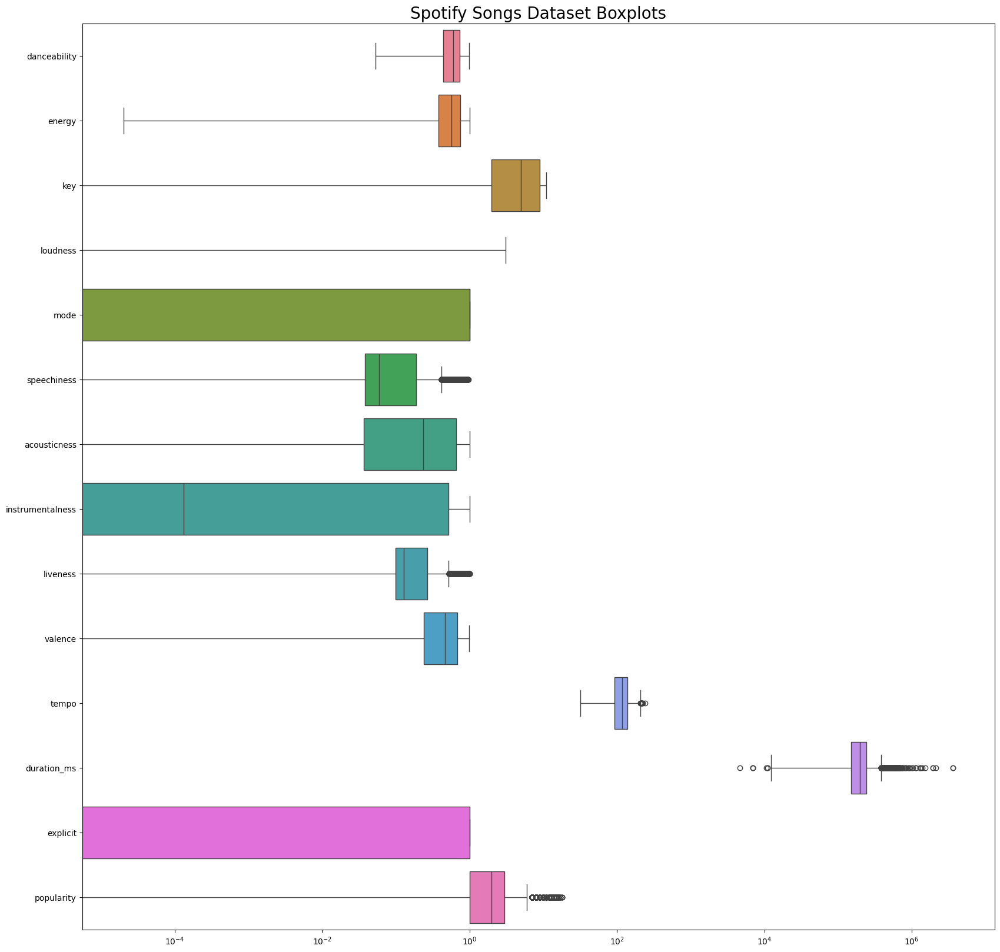

In [21]:
plt.figure(figsize = (20,20))
ax = sns.boxplot(data=df, orient="h")
ax.set_title('Spotify Songs Dataset Boxplots', fontsize=20)
ax.set(xscale='log')
plt.show()

In [22]:
columns = ['speechiness', 'liveness', 'tempo', 'duration_ms', 'popularity',]

def outlier_treatment(datacolumn):
    sorted_data = sorted(datacolumn)
    Q1, Q3 = np.percentile(sorted_data, [25, 75])
    IQR = Q3 - Q1
    lower_range = Q1 - (1.5 * IQR)
    upper_range = Q3 + (1.5 * IQR)
    return lower_range, upper_range

for column in columns:
    lower_bound, upper_bound = outlier_treatment(df[column])
    df[column] = np.clip(df[column], a_min=lower_bound, a_max=upper_bound)

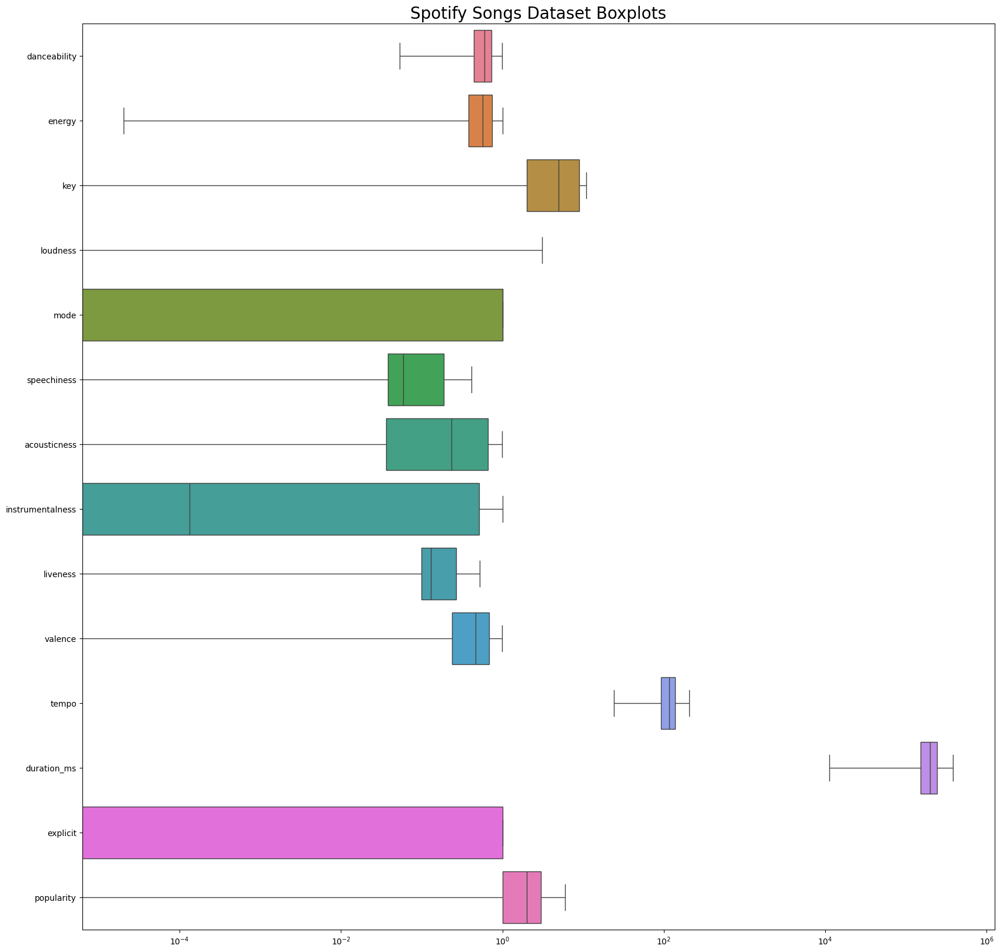

In [23]:
plt.figure(figsize = (20,20))
ax = sns.boxplot(data=df, orient="h")
ax.set_title('Spotify Songs Dataset Boxplots', fontsize=20)
ax.set(xscale='log')
plt.show()

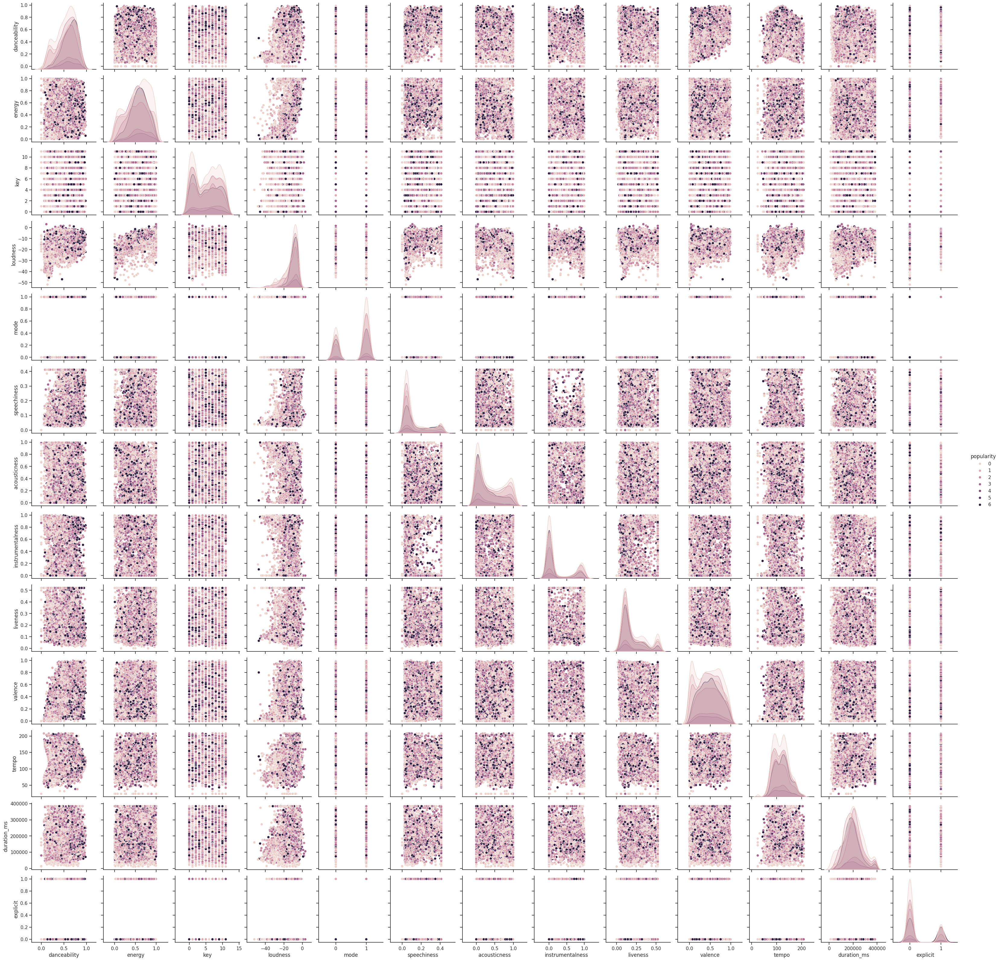

In [24]:
sns.set_theme(style="ticks")

sns.pairplot(df, hue="popularity")

In [25]:
corr_grid = df.corr()
corr_grid

,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_ms,explicit,popularity
danceability,1.000000,0.103576,0.001416,0.384798,-0.042417,0.327471,-0.253760,-0.334578,-0.230143,0.517143,0.086969,0.049815,0.373921,0.161761
energy,0.103576,1.000000,0.032848,0.668248,-0.043713,0.106455,-0.578071,-0.314757,0.256602,0.317266,0.172111,0.210259,0.114114,0.051435
key,0.001416,0.032848,1.000000,0.020238,-0.174170,-0.000319,-0.017361,-0.026367,-0.005646,0.015964,-0.001790,0.009780,-0.004508,-0.000666
loudness,0.384798,0.668248,0.020238,1.000000,0.007145,0.110458,-0.491999,-0.547323,0.012538,0.426773,0.202815,0.295919,0.181269,0.168118
mode,-0.042417,-0.043713,-0.174170,0.007145,1.000000,-0.100763,0.038880,-0.063921,-0.025996,0.000239,0.017041,0.030439,-0.108569,-0.034082
speechiness,0.327471,0.106455,-0.000319,0.110458,-0.100763,1.000000,-0.179189,-0.298854,0.068556,0.113458,0.060028,-0.127025,0.645704,0.053328
acousticness,-0.253760,-0.578071,-0.017361,-0.491999,0.038880,-0.179189,1.000000,0.291034,-0.054387,-0.215388,-0.184113,-0.179028,-0.239925,-0.127699
instrumentalness,-0.334578,-0.314757,-0.026367,-0.547323,-0.063921,-0.298854,0.291034,1.000000,-0.033366,-0.335547,-0.120093,-0.235731,-0.354818,-0.080953
liveness,-0.230143,0.256602,-0.005646,0.012538,-0.025996,0.068556,-0.054387,-0.033366,1.000000,-0.087485,-0.020649,0.007245,0.019128,-0.065062
valence,0.517143,0.317266,0.015964,0.426773,0.000239,0.113458,-0.215388,-0.335547,-0.087485,1.000000,0.171715,0.097643,0.076340,0.051789


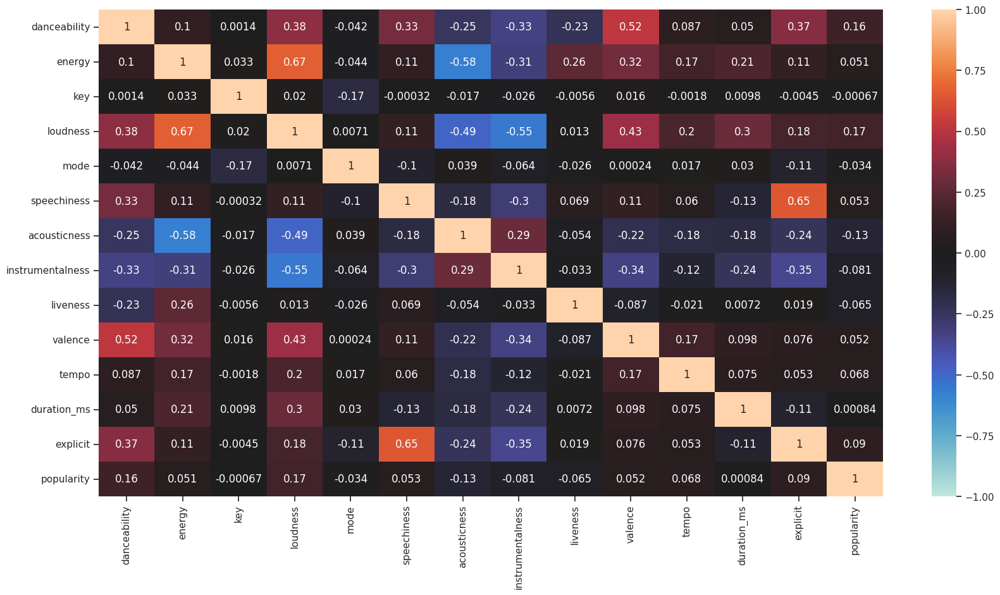

In [28]:
plt.figure(figsize = (20,10))
sns.heatmap(corr_grid, vmin=-1, center=0, vmax=1, annot=True)
plt.show()

In [29]:
df.head()

,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_ms,explicit,popularity
0,0.530,0.770,4,-6.633,0,0.0389,0.284,0.501000,0.52105,0.623,120.144,225696,0,2
1,0.565,0.730,1,-6.063,1,0.0730,0.365,0.000000,0.23700,0.511,130.026,158093,0,2
2,0.427,0.546,4,-8.727,1,0.0849,0.539,0.015200,0.36800,0.435,78.345,167262,0,2
3,0.421,0.531,7,-5.516,1,0.0262,0.706,0.000208,0.11000,0.383,85.080,236832,0,2
4,0.537,0.804,8,-7.378,0,0.1570,0.379,0.000489,0.32300,0.543,139.950,239400,0,2


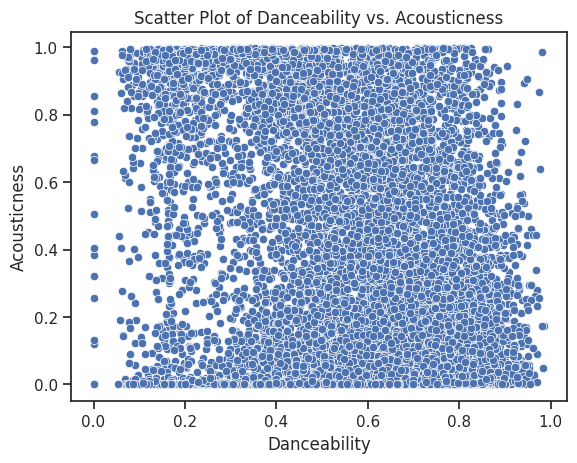

In [31]:
sns.scatterplot(data = df, x='danceability', y='acousticness')

plt.xlabel('Danceability')
plt.ylabel('Acousticness')
plt.title('Scatter Plot of Danceability vs. Acousticness')

plt.show()

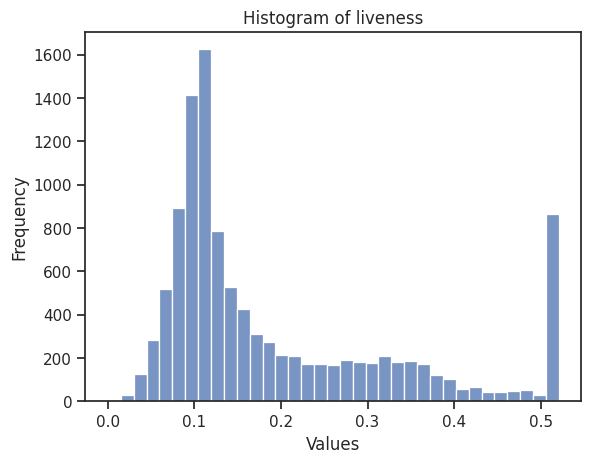

In [34]:
def create_histogram(df, column_name):
    sns.histplot(data=df[column_name])

    plt.xlabel('Values')
    plt.ylabel('Frequency')
    plt.title('Histogram of ' + column_name)

    plt.show()

create_histogram(df, 'liveness')

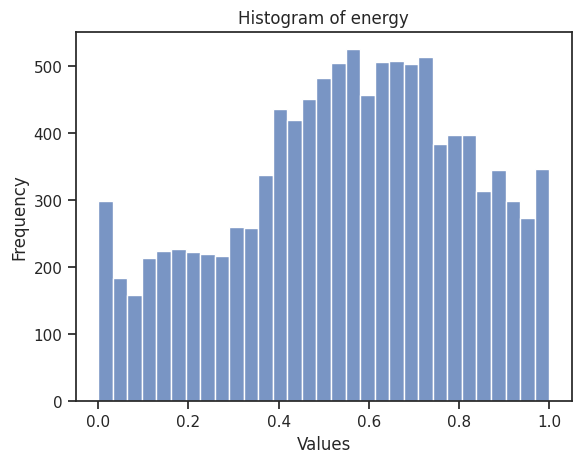

In [35]:
def create_histogram(df, column_name):
    sns.histplot(data=df[column_name])

    plt.xlabel('Values')
    plt.ylabel('Frequency')
    plt.title('Histogram of ' + column_name)

    plt.show()

create_histogram(df, 'energy')

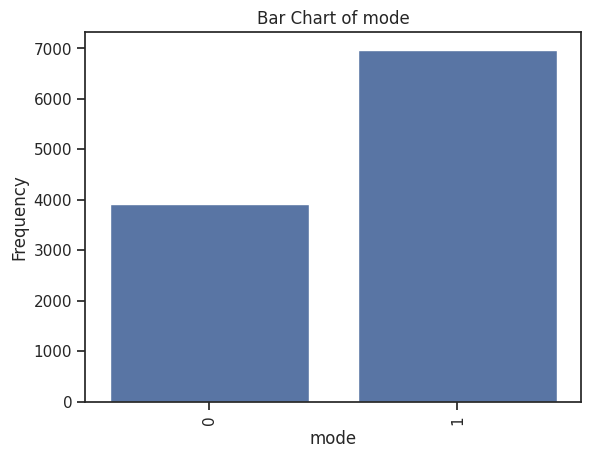

In [37]:
def create_bar_chart(df, column_name):
    category_counts = df[column_name].value_counts()

    sns.barplot(x=category_counts.index, y=category_counts.values)
    plt.xlabel(column_name)
    plt.ylabel('Frequency')
    plt.title('Bar Chart of ' + column_name)
    plt.xticks(rotation=90)

    plt.show()

create_bar_chart(df, 'mode')

In [38]:
X = df.drop('explicit', axis=1)
y = df['explicit']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20, random_state=0, stratify=y)

scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

In [39]:
logistic_regression = LogisticRegression()

logistic_regression.fit(X_train, y_train)

y_pred = logistic_regression.predict(X_test)

accuracy = logistic_regression.score(X_test, y_test)
print("Accuracy:", accuracy)

Accuracy: 0.8809742647058824


In [40]:
predictions = logistic_regression.predict(X_test)

In [41]:
predictions

array([0, 0, 1, ..., 0, 1, 1])

In [42]:
from sklearn.metrics import classification_report
print(classification_report(y_test,predictions))

              precision    recall  f1-score   support

           0       0.90      0.94      0.92      1589
           1       0.81      0.73      0.77       587

    accuracy                           0.88      2176
   macro avg       0.86      0.83      0.84      2176
weighted avg       0.88      0.88      0.88      2176



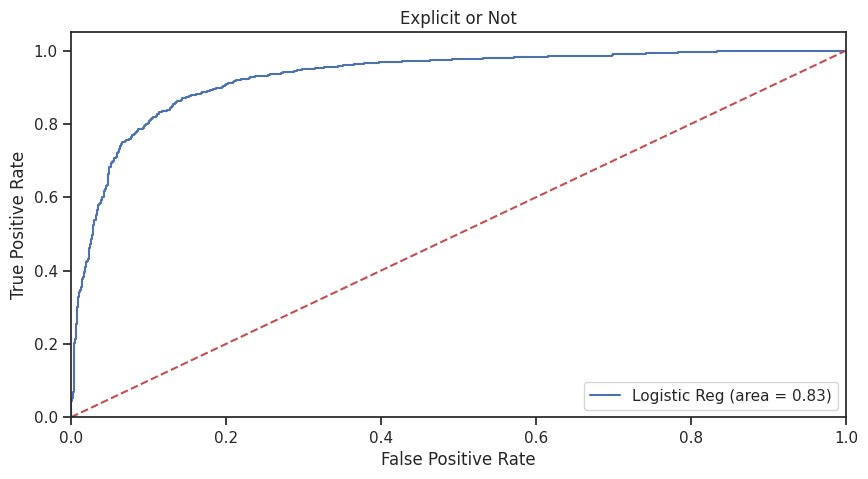

In [43]:
from sklearn.metrics import roc_auc_score
from sklearn.metrics import roc_curve
logit_roc_auc = roc_auc_score(y_test, logistic_regression.predict(X_test))
fpr, tpr, thresholds = roc_curve(y_test, logistic_regression.predict_proba(X_test)[:,1])
plt.figure(figsize=(10,5))
plt.plot(fpr, tpr, label='Logistic Reg (area = %0.2f)' % logit_roc_auc)
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Explicit or Not')
plt.legend(loc="lower right")
plt.savefig('Log_Reg_ROC')
plt.show()

In [44]:
from sklearn.naive_bayes import GaussianNB

In [45]:
NBmodel = GaussianNB()
NBmodel.fit(X_train, y_train)

GaussianNB()

In [46]:
predicted = NBmodel.predict(X_test)
predicted

array([0, 1, 1, ..., 0, 1, 1])

In [48]:
from sklearn.metrics import confusion_matrix

cm2 = confusion_matrix(y_test,predicted)
score2 = accuracy_score(y_test,predicted)
cr2 = classification_report(y_test,predicted)

In [49]:
print('Confusion Matrix for Naive Bayes:''\n',cm2 )
print('Accuracy Score for Naive Bayes:',score2 )
print('Classification Report for Naive Bayes:''\n''\n',cr2)

Confusion Matrix for Naive Bayes:
 [[1214  375]
 [  63  524]]
Accuracy Score for Naive Bayes: 0.7987132352941176
Classification Report for Naive Bayes:

               precision    recall  f1-score   support

           0       0.95      0.76      0.85      1589
           1       0.58      0.89      0.71       587

    accuracy                           0.80      2176
   macro avg       0.77      0.83      0.78      2176
weighted avg       0.85      0.80      0.81      2176



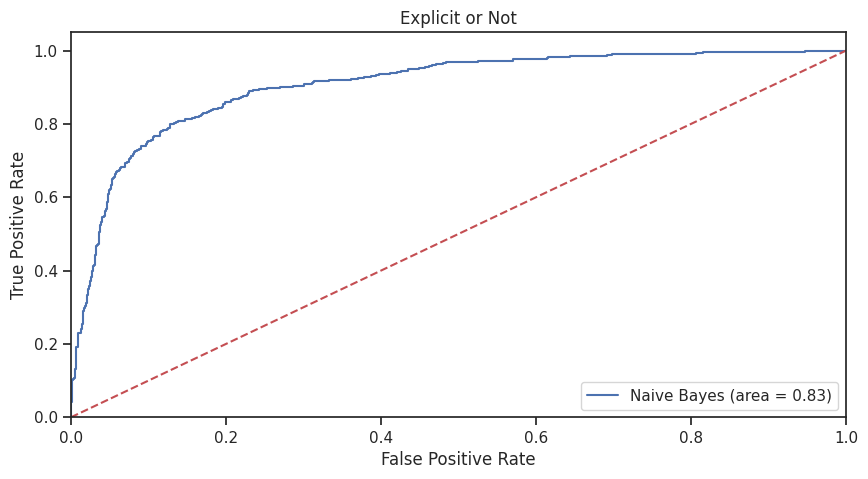

In [50]:
logit_roc_auc = roc_auc_score(y_test, NBmodel.predict(X_test))
fpr, tpr, thresholds = roc_curve(y_test, NBmodel.predict_proba(X_test)[:,1])
plt.figure(figsize=(10,5))
plt.plot(fpr, tpr, label='Naive Bayes (area = %0.2f)' % logit_roc_auc)
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Explicit or Not')
plt.legend(loc="lower right")
plt.savefig('NB_ROC')
plt.show()

In [51]:
# Decision Tree Classifier
dt_classifier = DecisionTreeClassifier()
dt_classifier.fit(X_train, y_train)
dt_predictions = dt_classifier.predict(X_test)
dt_probs = dt_classifier.predict_proba(X_test)

In [52]:
print("Decision Tree Classification Report:")
print(classification_report(y_test, dt_predictions))

Decision Tree Classification Report:
              precision    recall  f1-score   support

           0       0.89      0.90      0.90      1589
           1       0.72      0.71      0.72       587

    accuracy                           0.85      2176
   macro avg       0.81      0.80      0.81      2176
weighted avg       0.85      0.85      0.85      2176



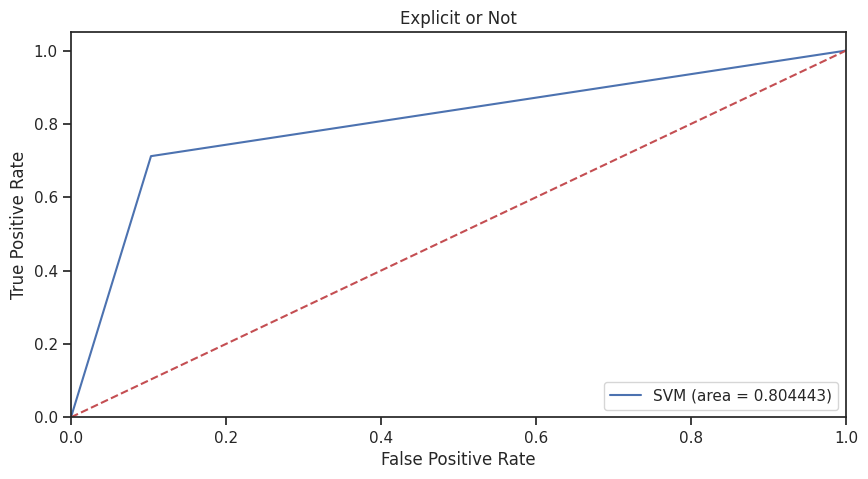

In [53]:
SVM_roc_auc = roc_auc_score(y_test,dt_classifier.predict(X_test))
fpr, tpr, thresholds = roc_curve(y_test, dt_classifier.predict_proba(X_test)[:,1])
plt.figure(figsize=(10,5))
plt.plot(fpr, tpr, label='SVM (area = %02f)' % SVM_roc_auc)
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Explicit or Not')
plt.legend(loc="lower right")
plt.savefig('D_Class_ROC')
plt.show()

In [54]:
from sklearn.metrics import confusion_matrix
print(confusion_matrix(y_test, dt_predictions))

[[1425  164]
 [ 169  418]]


In [55]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

dt_classifier = DecisionTreeClassifier()
dt_classifier.fit(X_train, y_train)

y_pred = dt_classifier.predict(X_test)

accuracy = accuracy_score(y_test, y_pred)

precision = precision_score(y_test, y_pred, average='macro')

recall = recall_score(y_test, y_pred, average='macro')

f1 = f1_score(y_test, y_pred, average='macro')

print("Accuracy:", accuracy)
print("Precision:", precision)
print("Recall:", recall)
print("F1-score:", f1)

Accuracy: 0.8442095588235294
Precision: 0.8019017689536349
Recall: 0.8085077051317674
F1-score: 0.8050751634824571


In [56]:
# Random Forest Classifier (Ensemble Method)
rf_classifier = RandomForestClassifier()
rf_classifier.fit(X_train, y_train)
rf_predictions = rf_classifier.predict(X_test)
rf_probs = rf_classifier.predict_proba(X_test)

In [57]:
print("Random Forest Classification Report:")
print(classification_report(y_test, rf_predictions))

Random Forest Classification Report:
              precision    recall  f1-score   support

           0       0.93      0.93      0.93      1586
           1       0.81      0.81      0.81       590

    accuracy                           0.89      2176
   macro avg       0.87      0.87      0.87      2176
weighted avg       0.89      0.89      0.89      2176



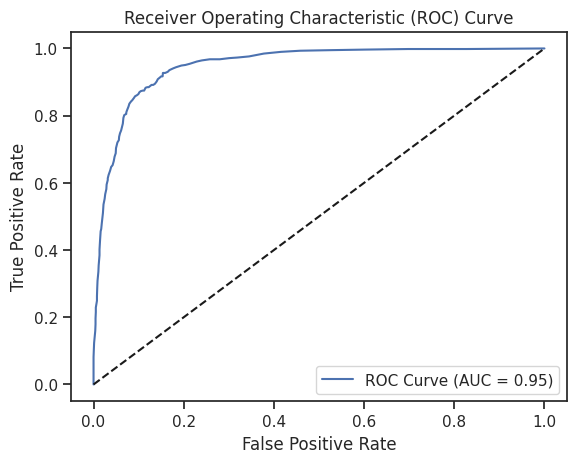

In [58]:
# Calculate the predicted probabilities for the positive class
rf_probs_positive = rf_probs[:, 1]

# Calculate the false positive rate, true positive rate, and thresholds
fpr, tpr, thresholds = roc_curve(y_test, rf_probs_positive)

# Calculate the AUC score
auc_score = roc_auc_score(y_test, rf_probs_positive)

# Plot the ROC curve
plt.plot(fpr, tpr, label='ROC Curve (AUC = {:.2f})'.format(auc_score))
plt.plot([0, 1], [0, 1], 'k--')  # Diagonal line representing random classifier
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')

# Display the plot
plt.show()

In [59]:
from xgboost import XGBClassifier

X = df.drop('explicit', axis=1)
y = df['explicit']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

xgb_classifier = XGBClassifier()
xgb_classifier.fit(X_train, y_train)

y_pred = xgb_classifier.predict(X_test)

accuracy = accuracy_score(y_test, y_pred)

precision = precision_score(y_test, y_pred, average='macro')

recall = recall_score(y_test, y_pred, average='macro')

f1 = f1_score(y_test, y_pred, average='macro')

print("Accuracy:", accuracy)
print("Precision:", precision)
print("Recall:", recall)
print("F1-score:", f1)

Accuracy: 0.8901654411764706
Precision: 0.8591905777402579
Recall: 0.8655791138564131
F1-score: 0.8622906976898136
